In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
def imshow(image=None,title = "Image",size = 10):
    w,h = image.shape[0],image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize = ((size * aspect_ratio),size))
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

### Basic Resize Processes 
<ul>
<li> Scaling - Linear Interpolation
<li> 0.75x Scaling - Linear Interpolation
<li> 2x Scaling Inter Cubic
<li> 2x Scaling Inter Nearest
<li> 2x Scaling Inter Area
    
</ul>
<b>varies with the project resize can be done</b><br>
<em>resized images can be verified with it axis

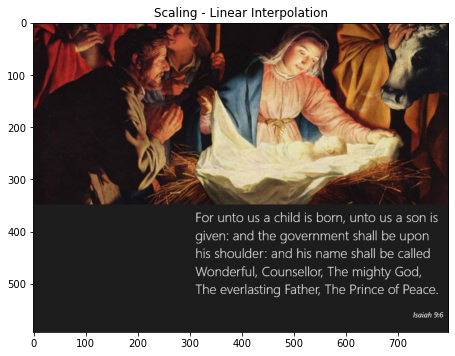

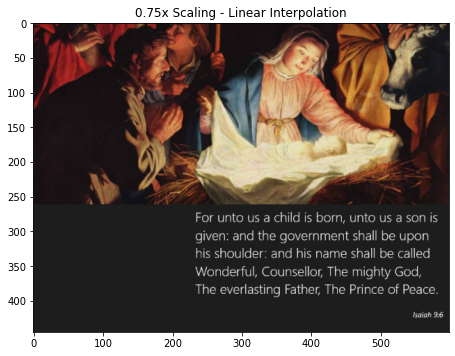

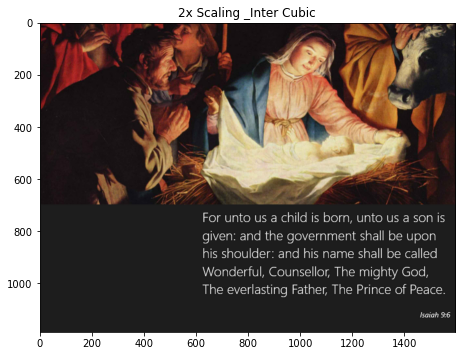

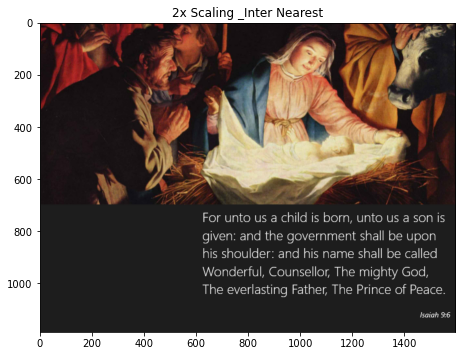

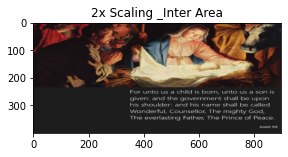

In [4]:
image = cv2.imread("presentation.png")
imshow(image, "Scaling - Linear Interpolation")

image_scaled = cv2.resize(image,None,fx=0.75,fy=0.75)
imshow(image_scaled,"0.75x Scaling - Linear Interpolation")

image_scaled2 = cv2.resize(image,None,fx=2,fy=2,interpolation=cv2.INTER_CUBIC)
imshow(image_scaled2, "2x Scaling _Inter Cubic")

image_scaled3 = cv2.resize(image,None,fx=2,fy=2,interpolation=cv2.INTER_NEAREST)
imshow(image_scaled3, "2x Scaling _Inter Nearest")

image_scaled4 = cv2.resize(image,(900,400),interpolation=cv2.INTER_AREA)
imshow(image_scaled4, "2x Scaling _Inter Area")

### Pyramid rescale 
<ul>
<li> Pyramid Down(reduces images scales)
<li> Pyramid Up(upscale images)
    
</ul>
<b>varies with the project resize can be done</b><br>
<em>resized images can be verified with it axis<em>

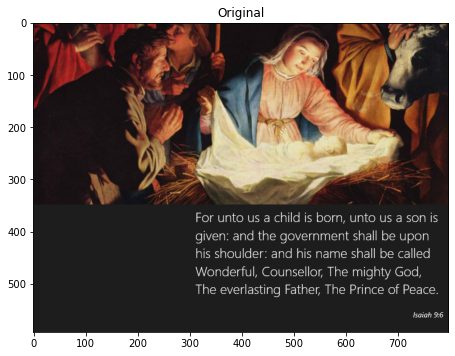

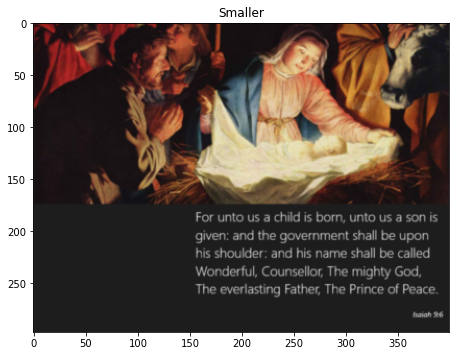

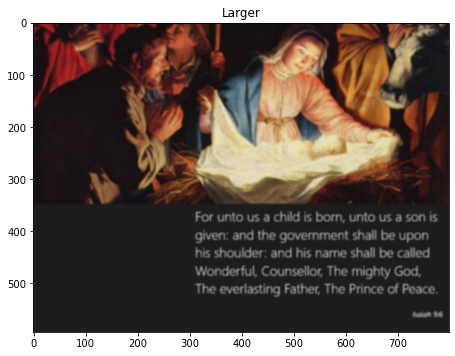

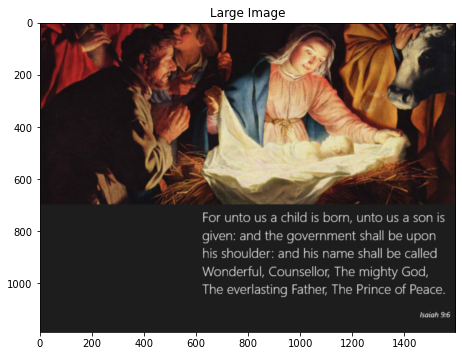

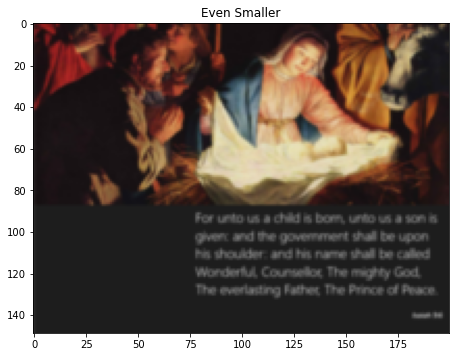

In [4]:
image = cv2.imread("presentation.png")

smaller = cv2.pyrDown(image)
larger = cv2.pyrUp(smaller)
large = cv2.pyrUp(image)

imshow(image,"Original")
imshow(smaller,"Smaller")
imshow(larger,"Larger")
imshow(large,"Large Image")

even_smaller = cv2.pyrDown(smaller)
imshow(even_smaller,"Even Smaller")

### Cropping 
<h3>Steps of cropping</h3>
<ol>
<li> Reading your image
<li> Drawing a rectangle on the region of the image to be cropped
<li>viewing the image cropped
    
</ol>

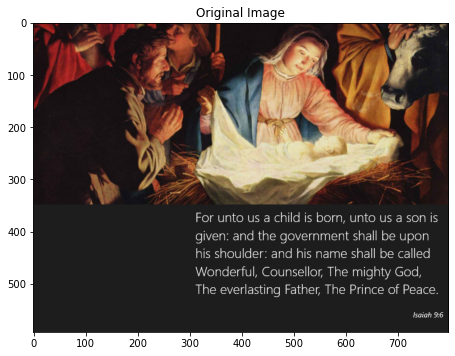

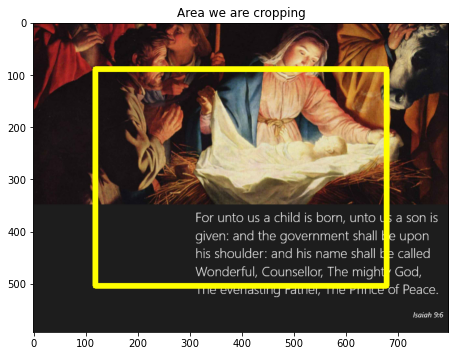

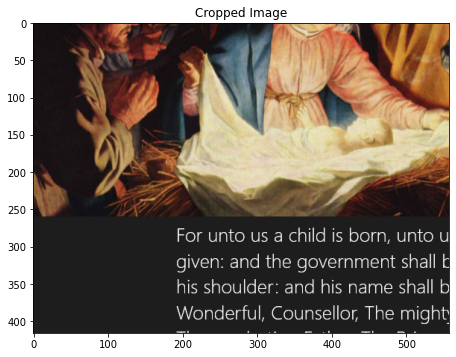

In [5]:
image = cv2.imread("presentation.png")

h,w = image.shape[:2]

start_row,start_col = int(h*.15),int(w*.15)

end_row,end_col = int(h*.85),int(w*.85)

cropped = image[start_row:end_row,start_col:end_col]

imshow(image,"Original Image")

copy = image.copy()
cv2.rectangle(copy, (start_col,start_row),(end_col,end_row),(0,255,255),10)

imshow(copy,"Area we are cropping")

imshow(cropped,"Cropped Image")

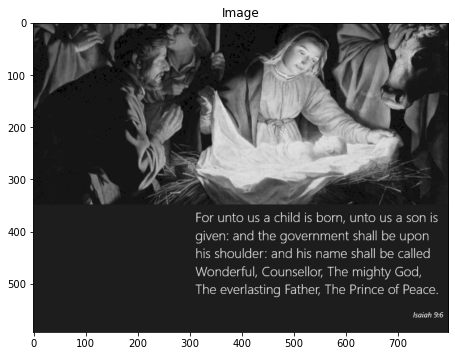

In [6]:
image = cv2.imread("presentation.png",0)
imshow(image)

M = np.ones(image.shape,dtype = "uint8")*100

<h3>Increasing Brightness with cv.add and numpy adding

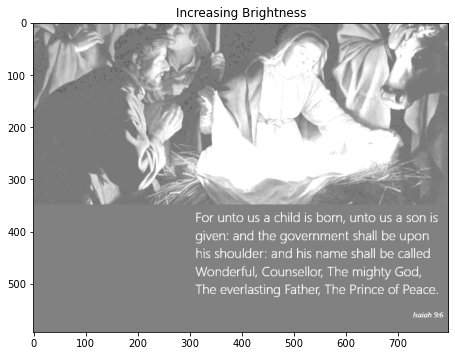

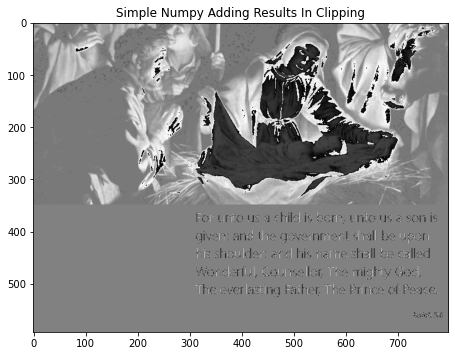

In [7]:
added = cv2.add(image,M)
imshow(added,"Increasing Brightness")

added2 = image + M
imshow(added2,"Simple Numpy Adding Results In Clipping")

<h3>Decreasing Brightness with cv.subtract and numpy subtraction

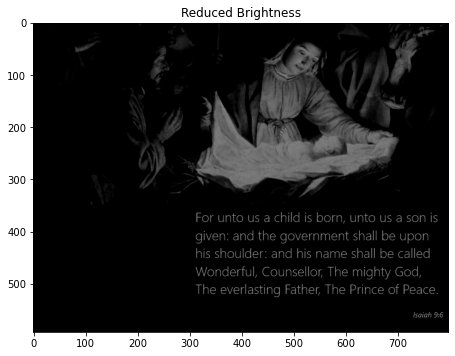

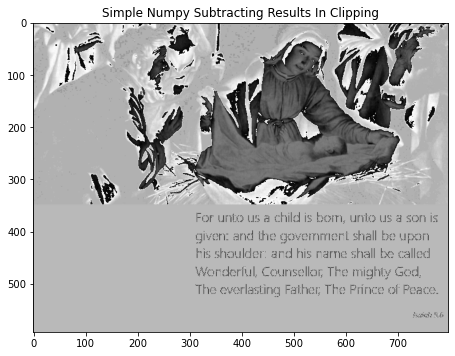

In [8]:
sub = cv2.subtract(image,M)
imshow(sub,"Reduced Brightness")

sub2 = image - M
imshow(sub2,"Simple Numpy Subtracting Results In Clipping")

## Bitwise Operations

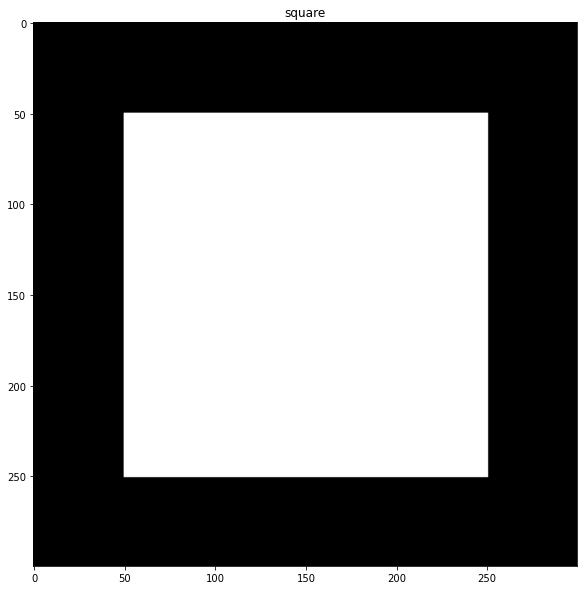

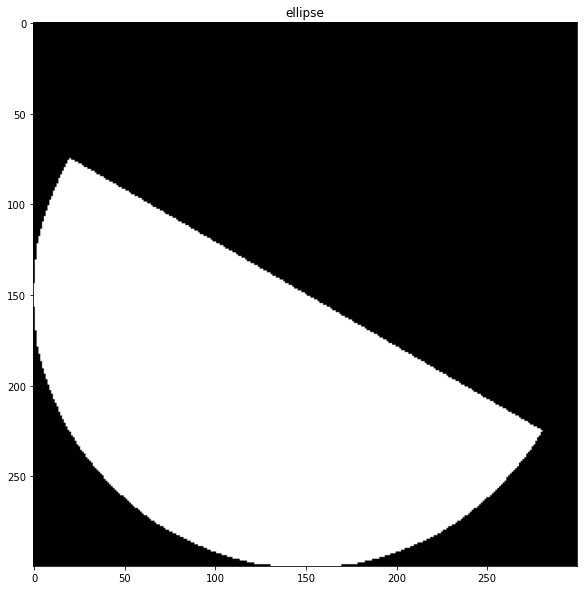

In [9]:
square = np.zeros((300,300),np.uint8)
cv2.rectangle(square,(50,50),(250,250),255,-2)
imshow(square,"square")

ellipse = np.zeros((300,300),np.uint8)
cv2.ellipse(ellipse,(150,150),(150,150),30,0,180,255,-1)
imshow(ellipse,"ellipse")

### Bitwise And,Or,Not,Xor

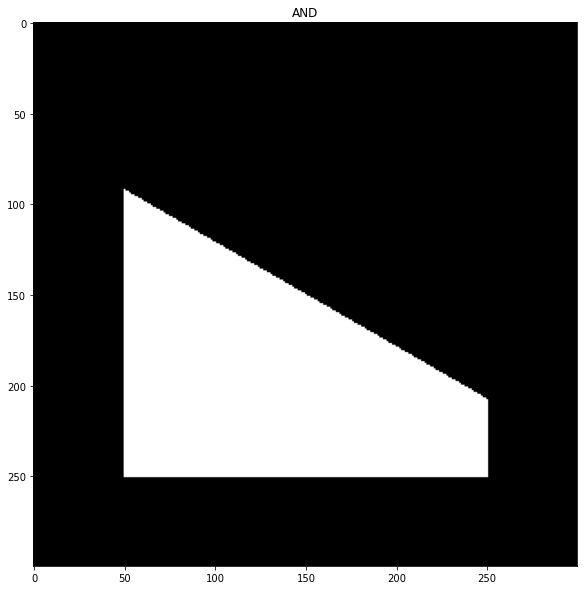

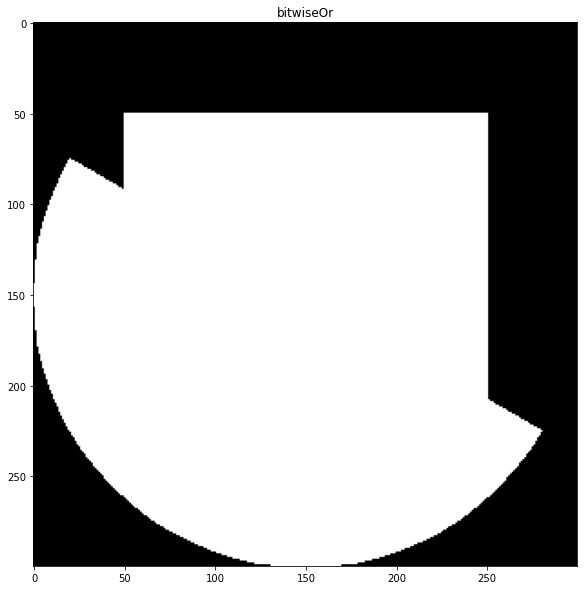

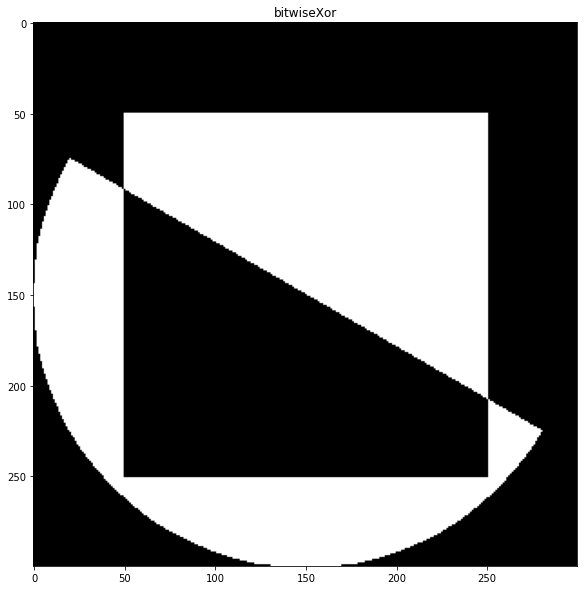

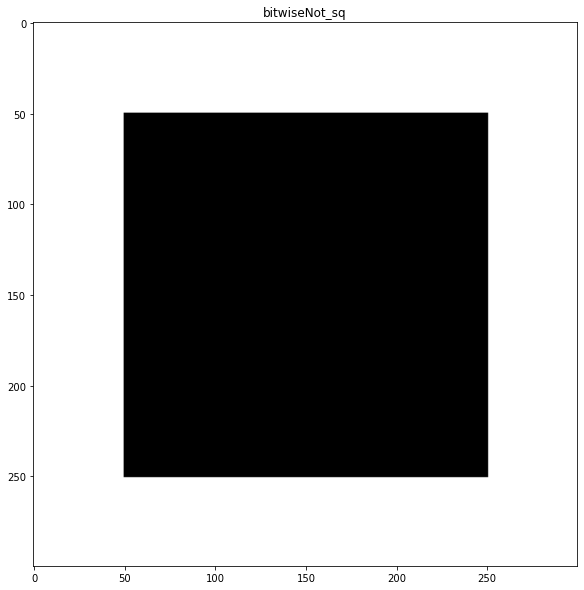

In [10]:
And = cv2.bitwise_and(square,ellipse)
imshow(And,"AND")

bitwiseOr = cv2.bitwise_or(square,ellipse)
imshow(bitwiseOr,"bitwiseOr")

bitwiseXor = cv2.bitwise_xor(square,ellipse)
imshow(bitwiseXor,"bitwiseXor")

bitwiseNot_sq = cv2.bitwise_not(square)
imshow(bitwiseNot_sq,"bitwiseNot_sq")

## Blurring By Convolution

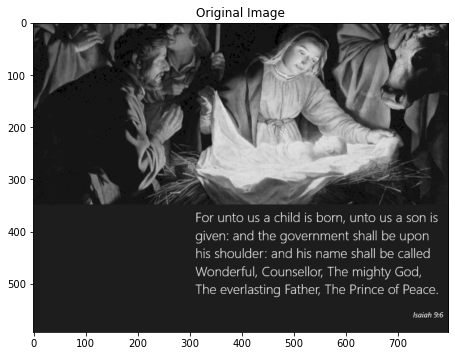

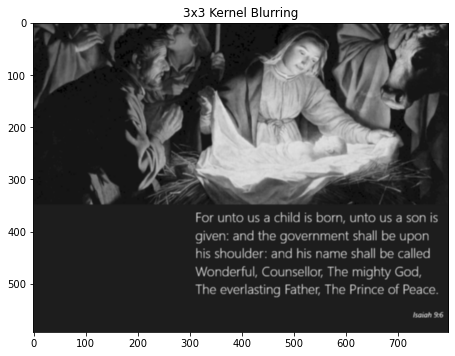

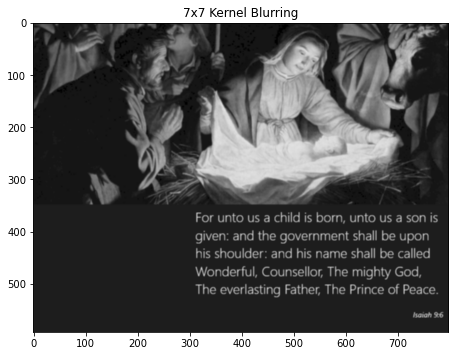

In [11]:
image = cv2.imread("presentation.png",0)
imshow(image,"Original Image")

kernel_3x3 = np.ones((3,3),np.float32)/9

blurred = cv2.filter2D(image,-1,kernel_3x3)
imshow(blurred,"3x3 Kernel Blurring")

kernel_7x7 = np.ones((7,7),np.float32)/49

blurred2 = cv2.filter2D(image,-1,kernel_7x7)
imshow(blurred,"7x7 Kernel Blurring")

### Other Commonly Used Blurring Methods In OpenCV

<ul> 
    <li>Regular Blurring</li>
    <li>Gaussian Blurring</li>
    <li>Median Blurring</li>
</ul>

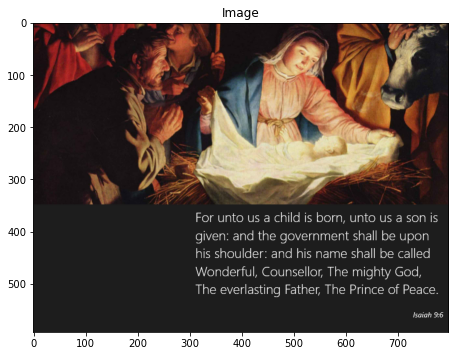

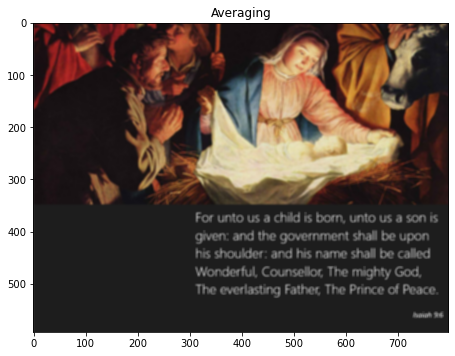

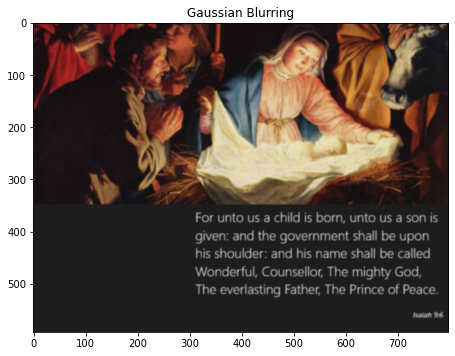

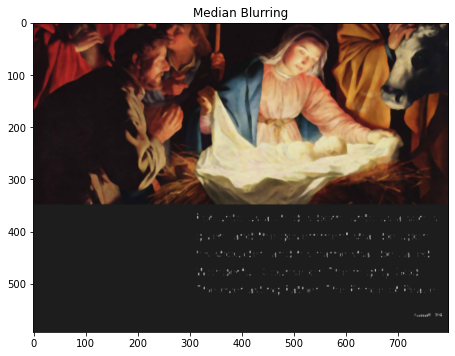

In [12]:
image = cv2.imread("presentation.png",)
imshow(image)

blur = cv2.blur(image,(5,5))
imshow(blur,"Averaging")

Gaussian = cv2.GaussianBlur(image,(5,5),0)
imshow(Gaussian,"Gaussian Blurring")

median = cv2.medianBlur(image,5)
imshow(median,"Median Blurring")

## Bilateral Filter(Noise Removal Algorithm)

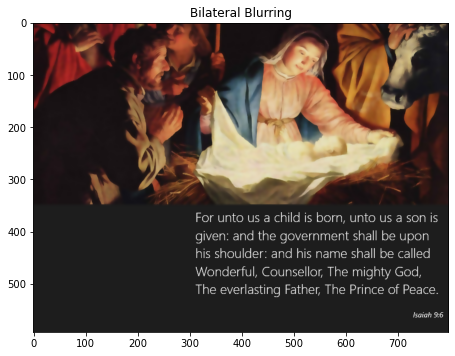

In [13]:
bilateral = cv2.bilateralFilter(image,9,75,75)
imshow(bilateral, "Bilateral Blurring") 

In [14]:
from skimage.filters import threshold_local

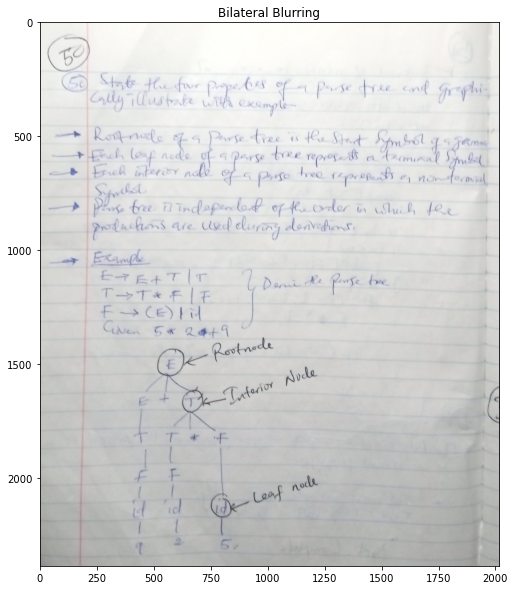

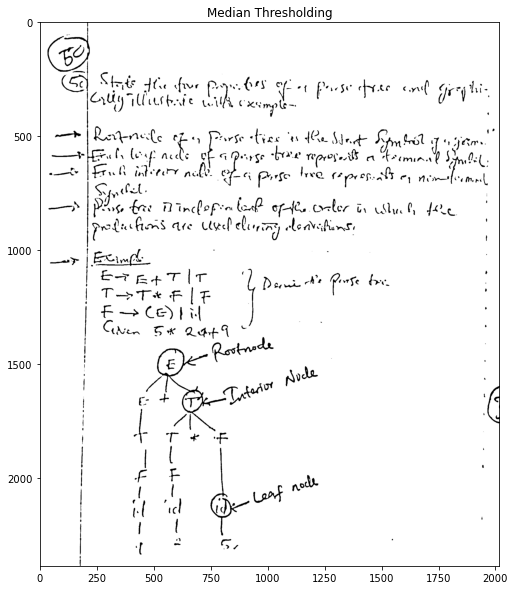

In [15]:
img2 = cv2.imread("AEHH0941.JPG")
bilateral = cv2.bilateralFilter(img2,9,75,75)
imshow(bilateral, "Bilateral Blurring") 
V = cv2.split(cv2.cvtColor(bilateral,cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V,25,offset = 15,method="median")

thresh = (V>T).astype("uint8") *255

cv2.imwrite("book2.png",thresh)

imshow(thresh,"Median Thresholding")

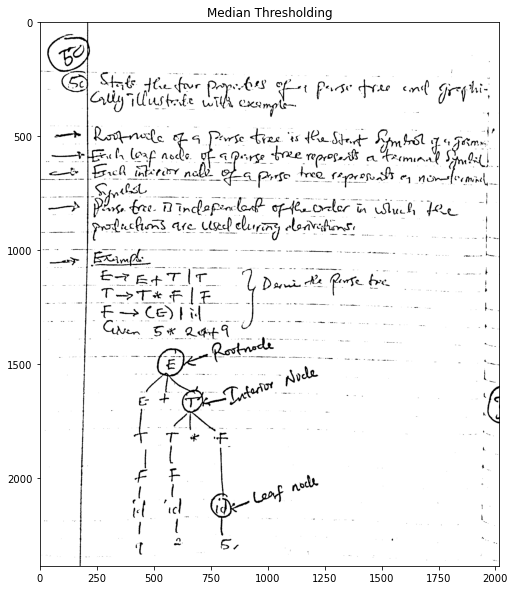

In [16]:
img2 = cv2.imread("AEHH0941.JPG")

V = cv2.split(cv2.cvtColor(img2,cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V,25,offset = 15,method="median")

thresh = (V>T).astype("uint8") *255

cv2.imwrite("book3.png",thresh)

imshow(thresh,"Median Thresholding")

### Non Local Denoising

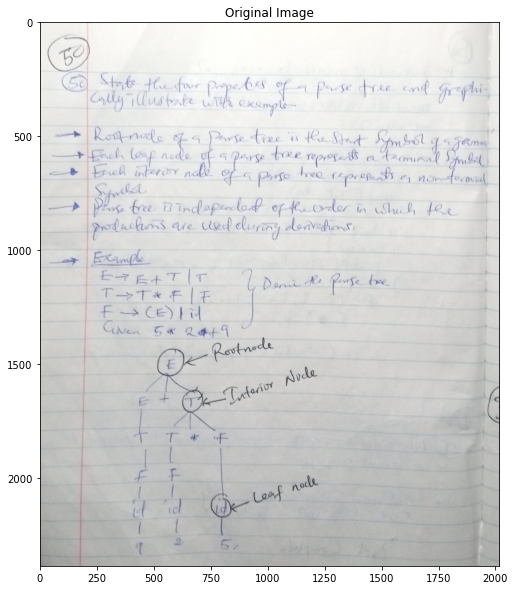

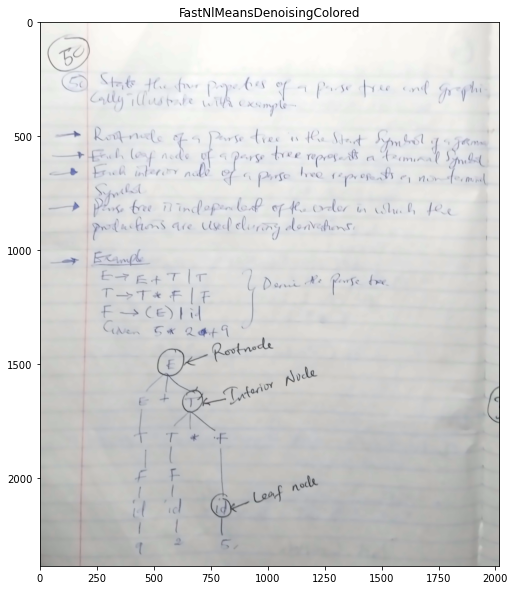

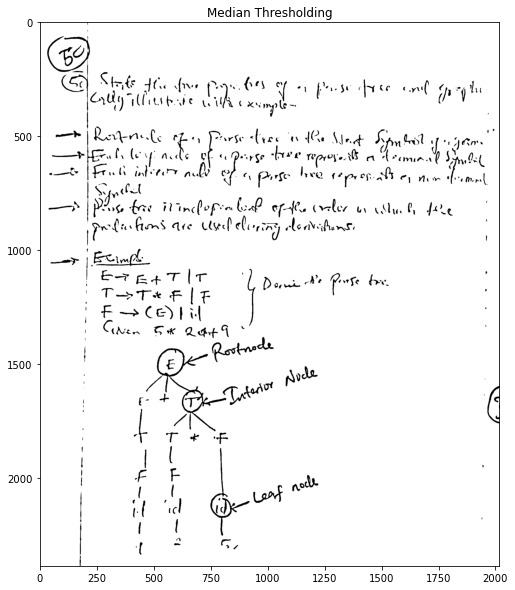

In [17]:
imshow(img2,"Original Image")

dst = cv2.fastNlMeansDenoisingColored(img2,None,6,6,7,21)
imshow(dst,"FastNlMeansDenoisingColored")

V = cv2.split(cv2.cvtColor(dst,cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V,25,offset = 15,method="median")

thresh = (V>T).astype("uint8") *255

# cv2.imwrite("book2.png",thresh)

imshow(thresh,"Median Thresholding")

## Sharpening Images

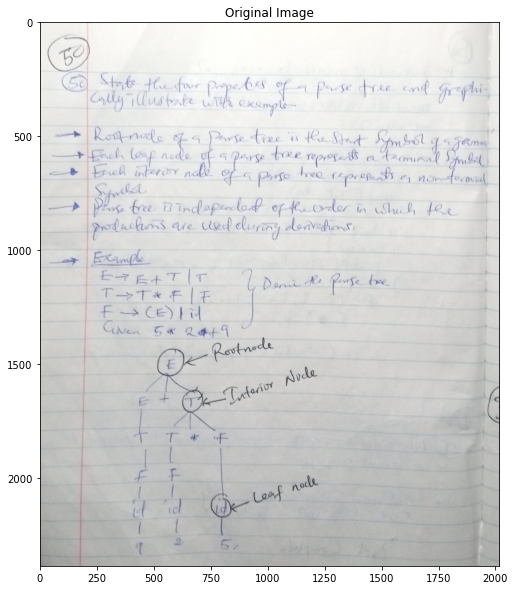

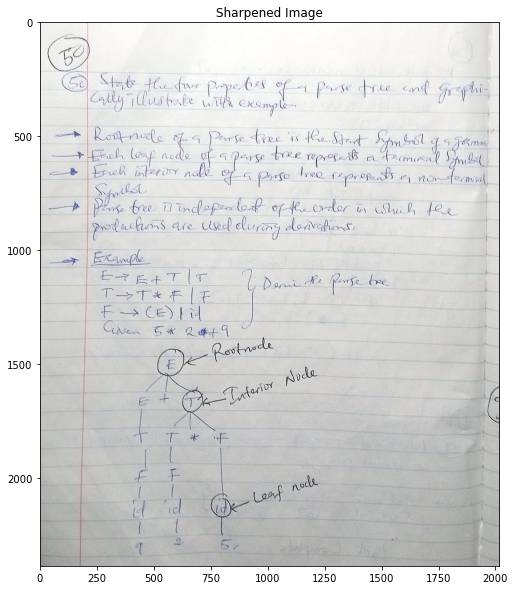

In [18]:
kernel_sharpening = np.array([[-1,-1,-1],
                             [-1,9,-1],
                             [-1,-1,-1]])

sharpened = cv2.filter2D(img2,-1,kernel_sharpening)
imshow(img2,"Original Image")
imshow(sharpened,"Sharpened Image")

### Image Thresholding With threshold_local from skimage.filters

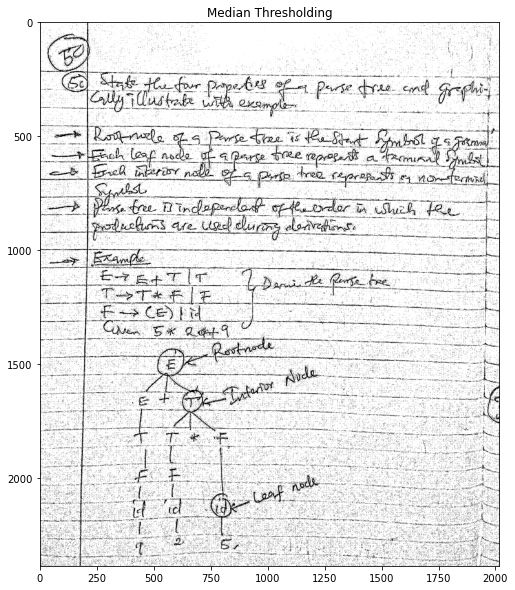

In [19]:
V = cv2.split(cv2.cvtColor(sharpened,cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V,25,offset = 15,method="median")

thresh = (V>T).astype("uint8") *255

# cv2.imwrite("book2.png",thresh)

imshow(thresh,"Median Thresholding")

#### Binary, Binary Innverse, Truncation, To Zero and To Zero Inverse Thresholding

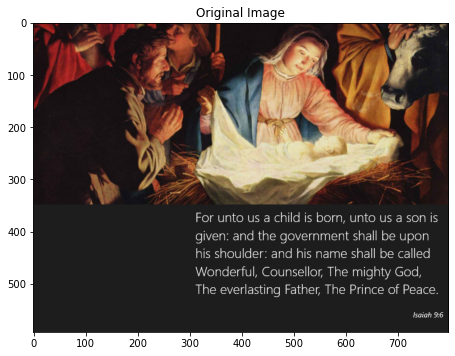

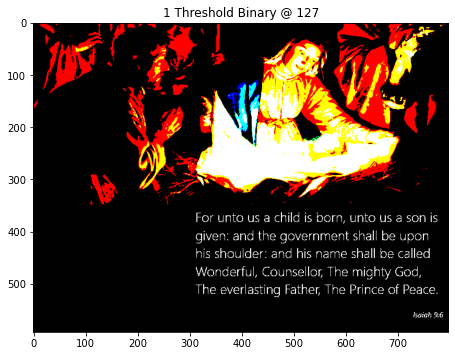

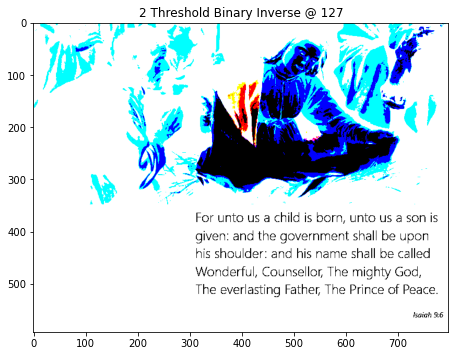

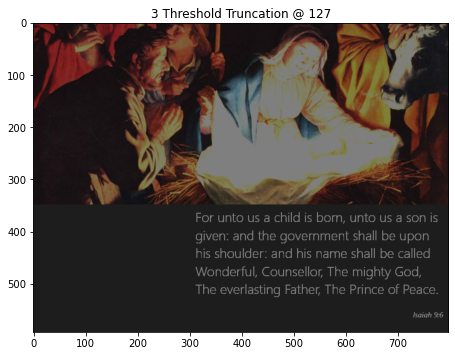

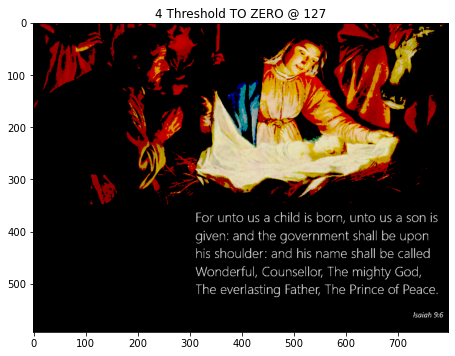

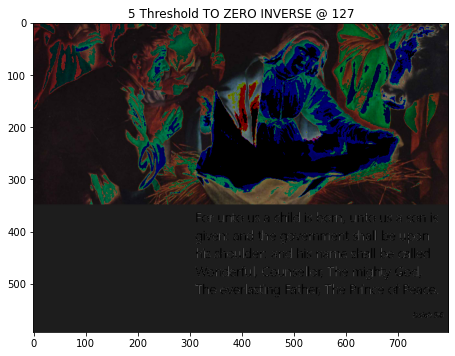

In [20]:
imshow(image,"Original Image")

ret,thresh1 = cv2.threshold(image,127,255,cv2.THRESH_BINARY)
imshow(thresh1, "1 Threshold Binary @ 127")

ret,thresh2 = cv2.threshold(image,127,255,cv2.THRESH_BINARY_INV)
imshow(thresh2, "2 Threshold Binary Inverse @ 127")

ret,thresh3 = cv2.threshold(image,127,255,cv2.THRESH_TRUNC)
imshow(thresh3, "3 Threshold Truncation @ 127")

ret,thresh4 = cv2.threshold(image,127,255,cv2.THRESH_TOZERO)
imshow(thresh4, "4 Threshold TO ZERO @ 127")

ret,thresh5 = cv2.threshold(image,127,255,cv2.THRESH_TOZERO_INV)
imshow(thresh5, "5 Threshold TO ZERO INVERSE @ 127")

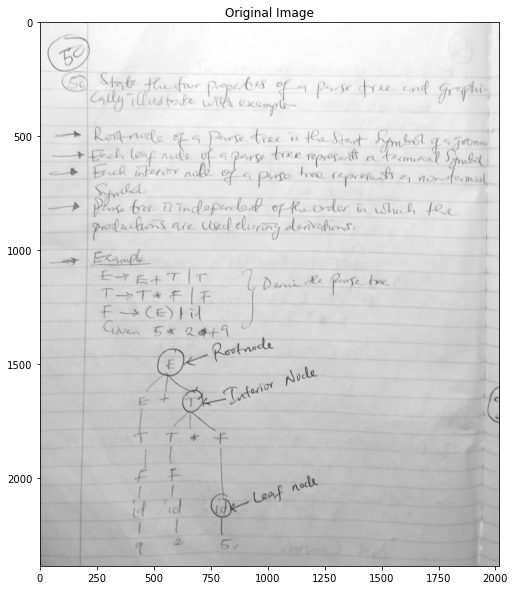

In [21]:
img2 = cv2.imread("AEHH0941.JPG",0)
imshow(img2,"Original Image")

<h3>Adaptive thresholding

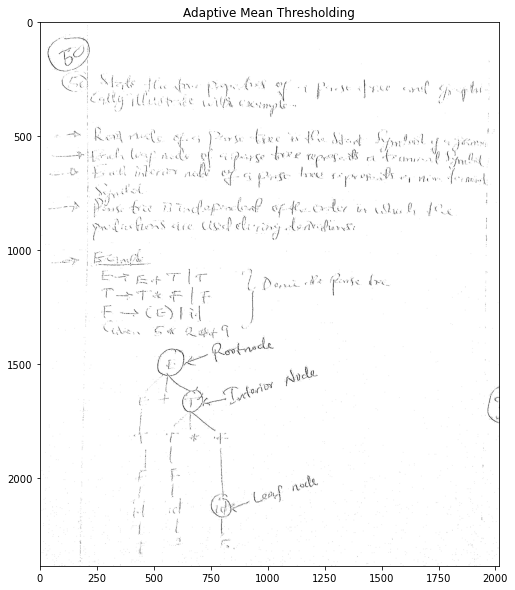

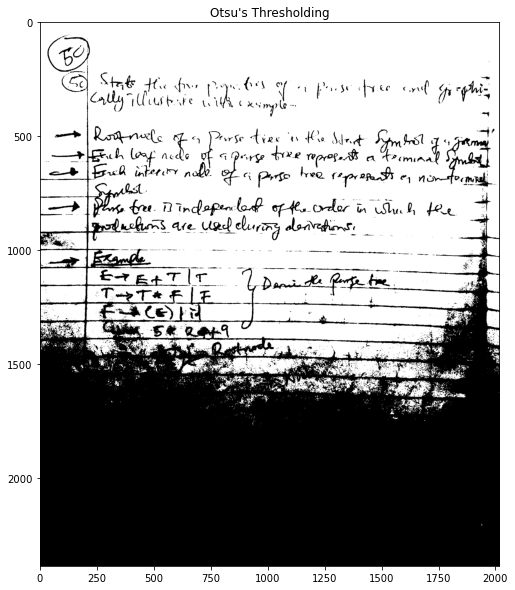

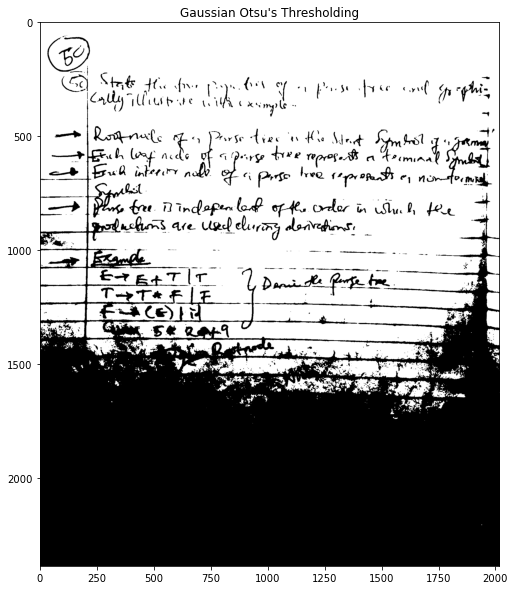

In [22]:
thresh = cv2.adaptiveThreshold(img2,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,5)
imshow(thresh,"Adaptive Mean Thresholding")

_,th2 = cv2.threshold(img2,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
imshow(th2,"Otsu's Thresholding")

blur = cv2.GaussianBlur(img2,(5,5),0)
_,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
imshow(th3, "Gaussian Otsu's Thresholding")

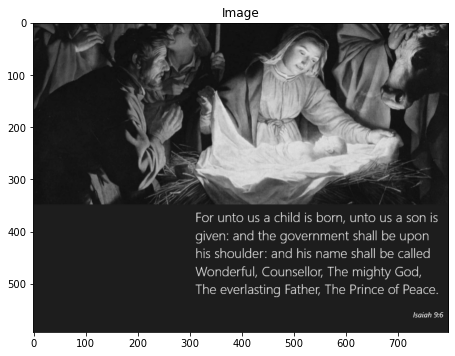

In [23]:
image_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
imshow(image_gray)

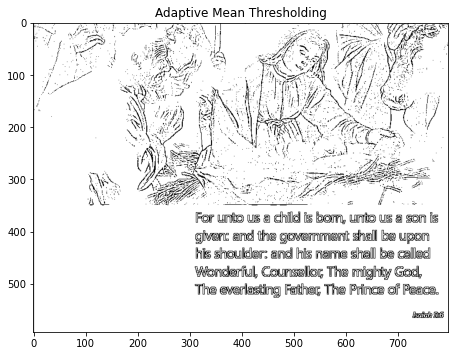

In [24]:
thresh22 = cv2.adaptiveThreshold(image_gray,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,5)
imshow(thresh22,"Adaptive Mean Thresholding")

# Dilation, Erosion and Edge Detection

<em>Erode and dilation are black and not white

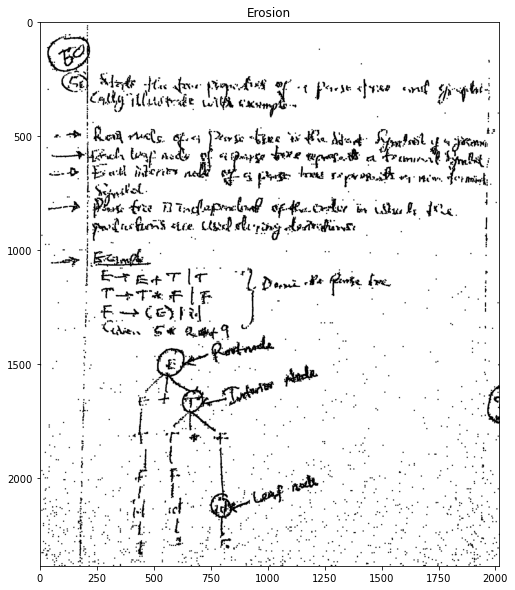

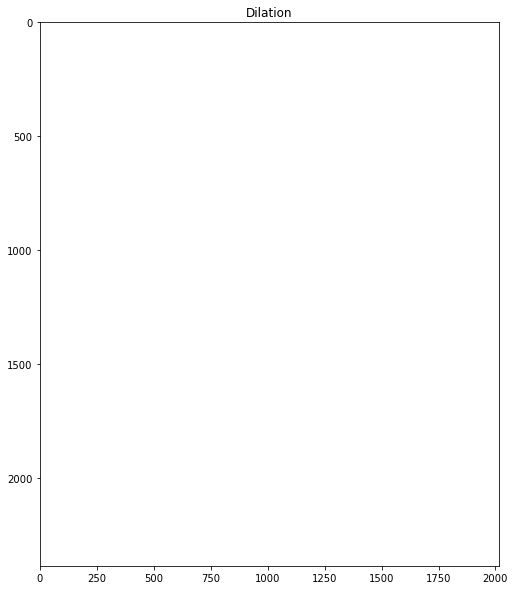

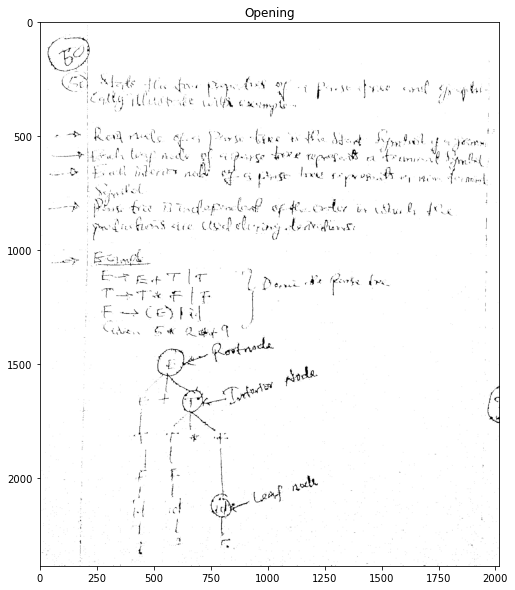

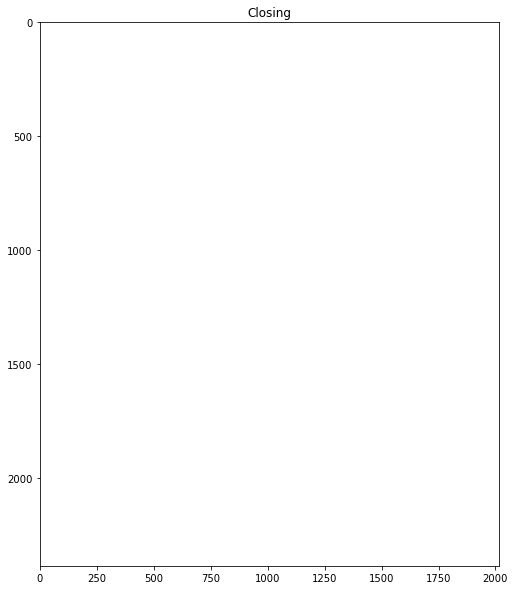

In [25]:
kernel = np.ones((5,5),np.uint8)

erosion = cv2.erode(thresh,kernel,iterations = 1)
imshow(erosion,"Erosion")

dilation = cv2.dilate(thresh,kernel,iterations = 1)
imshow(dilation,"Dilation")

opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel)
imshow(opening,"Opening")

closing = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel)
imshow(closing,"Closing")

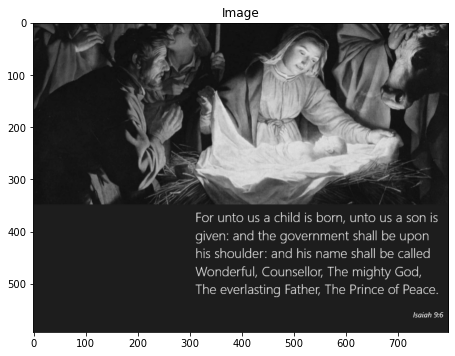

In [28]:
img4 = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
imshow(img4)

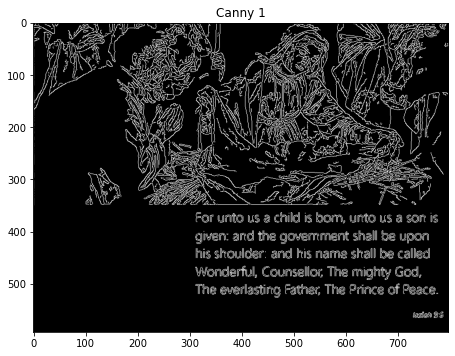

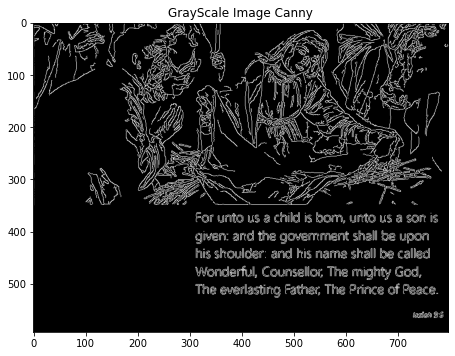

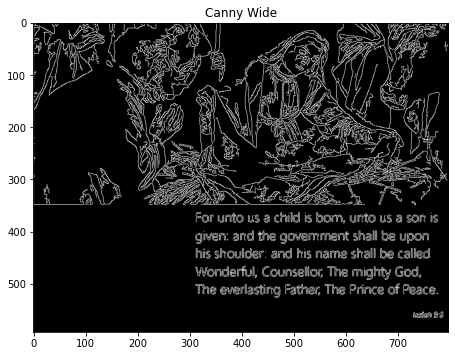

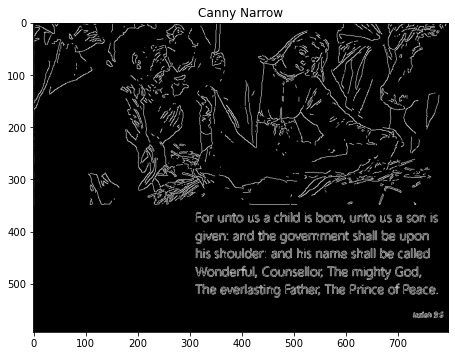

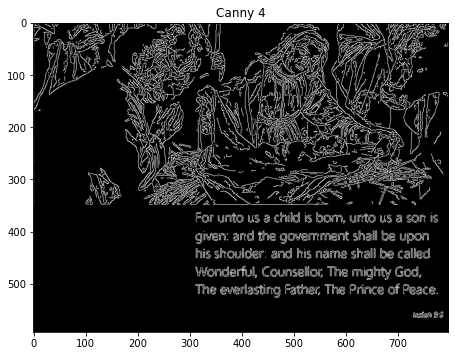

In [29]:
canny = cv2.Canny(image,50,120)
imshow(canny,"Canny 1")

canny1 = cv2.Canny(img4,50,120)
imshow(canny1,"GrayScale Image Canny")

canny = cv2.Canny(image,10,200)
imshow(canny,"Canny Wide")

canny = cv2.Canny(image,200,240)
imshow(canny,"Canny Narrow")

canny = cv2.Canny(image,60,110)
# canny = cv2.cvtColor(canny,cv2.cv2.THRESH_BINARY)
imshow(canny,"Canny 4")

### Auto Canny

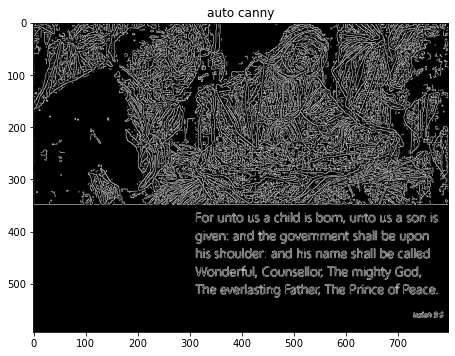

In [30]:
def autoCanny(image):
    
    blurred_img = cv2.blur(image,ksize=(5,5))
    med_val = np.median(image)
    lower = int(max(0,0.66*med_val))
    upper = int(min(255,1.33*med_val))
    edges = cv2.Canny(image = image,threshold1 = lower,threshold2 = upper)
    
    return edges

auto_canny = autoCanny(image)
imshow(auto_canny,"auto canny")

### Contours

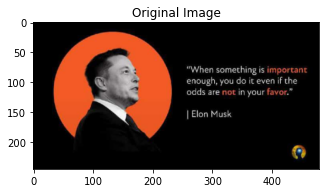

In [31]:
image = cv2.imread("2022.png")
imshow(image,"Original Image")

<strong>Approximation Method Option</strong>

cv2.CHAIN_APPROX_NONE - Stores all the point along the line(inefficient)

cv2.CHAIN_APPROX_SIMPLE - Stores the end points of each line

<strong>Hierachy</strong>
<ul>
    <li>First term is the index of the Next contour</li>
    <li>Second term is the index of the Previous contour</li>
    <li>Third term is the index of the Parent contour</li>
    <li>Forth term is the index of the Child contour</li>
</ul>

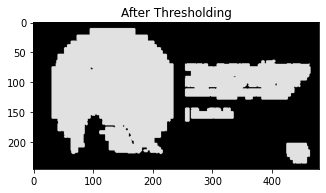

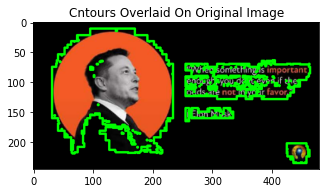

Number of Contours =  15


In [35]:
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

_,th2 = cv2.threshold(gray,0,225,cv2.THRESH_BINARY,cv2.THRESH_OTSU)
imshow(th2,"After Thresholding")

contours,hie = cv2.findContours(th2,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

cv2.drawContours(image,contours,-1,(0,255,0),thickness = 2)
imshow(image,"Cntours Overlaid On Original Image")

print("Number of Contours = ",str(len(contours)))

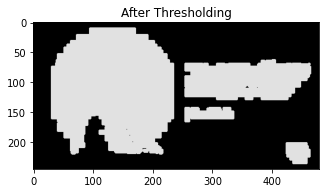

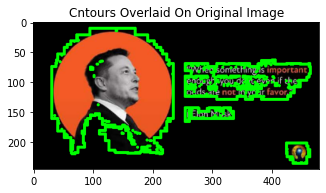

Number of Contours =  10


In [36]:
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

_,th2 = cv2.threshold(gray,0,225,cv2.THRESH_BINARY,cv2.THRESH_OTSU)
imshow(th2,"After Thresholding")

contours,hie = cv2.findContours(th2,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

cv2.drawContours(image,contours,-1,(0,255,0),thickness = 2)
imshow(image,"Cntours Overlaid On Original Image")

print("Number of Contours = ",str(len(contours)))

In [37]:
contours[0][0]

array([[183, 211]], dtype=int32)

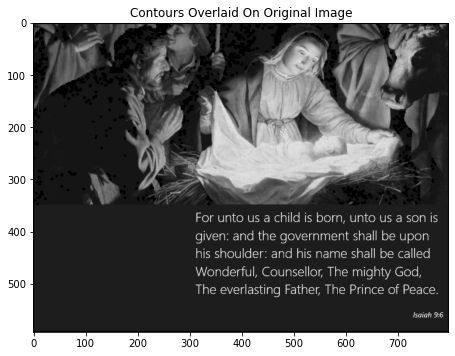

Number of Contours =  760


In [7]:
gray = cv2.imread("presentation.png",0)

# gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

contours,hie = cv2.findContours(gray,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

cv2.drawContours(gray,contours,-1,(0,255,0),thickness = 2)
imshow(gray,"Contours Overlaid On Original Image")

print("Number of Contours = ",str(len(contours)))

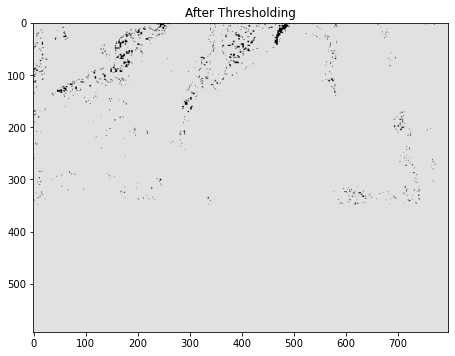

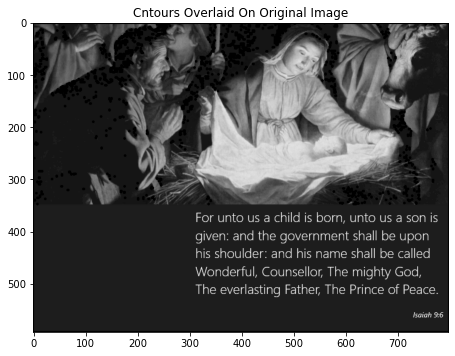

Number of Contours =  760


In [39]:
gray = cv2.imread("presentation.png",0)

# gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

_,th2 = cv2.threshold(gray,0,225,cv2.THRESH_BINARY,cv2.THRESH_OTSU)
imshow(th2,"After Thresholding")

contours,hie = cv2.findContours(th2,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

cv2.drawContours(gray,contours,-1,(0,255,0),thickness = 2)
imshow(gray,"Cntours Overlaid On Original Image")

print("Number of Contours = ",str(len(contours)))

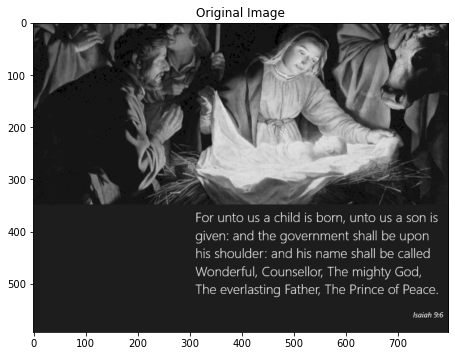

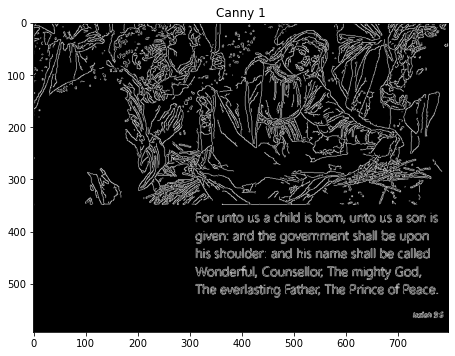

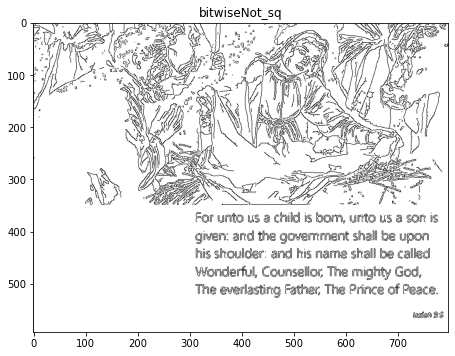

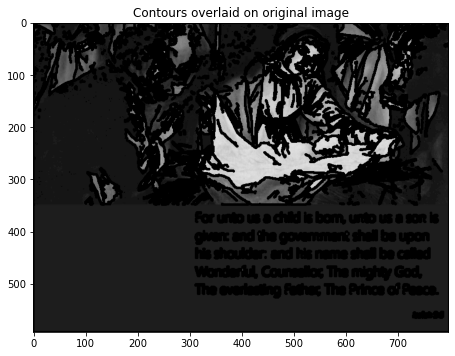

Number of Contours =  7746


In [40]:
gray = cv2.imread("presentation.png",0)
imshow(gray,"Original Image")

canny = cv2.Canny(gray,50,120)
imshow(canny,"Canny 1")

bitwiseNot_sq = cv2.bitwise_not(canny)
imshow(bitwiseNot_sq,"bitwiseNot_sq")

con,hie = cv2.findContours(bitwiseNot_sq,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

cv2.drawContours(gray,con,-1,(0,2555,0),thickness=2)
imshow(gray,"Contours overlaid on original image")
print("Number of Contours = ",str(len(con)))

### <b> RETR_LIST: Retrieval List</b><br>
Retrievs all the contours, but doesn't create any parent-child relationship. Parent and kids are equal under this rule, and they are just contours.

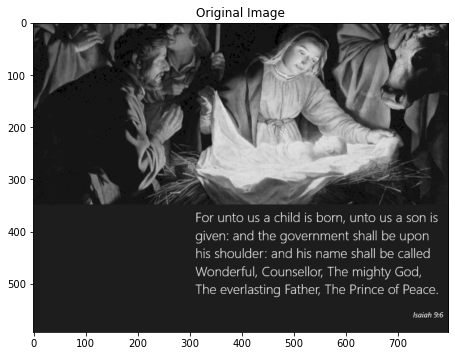

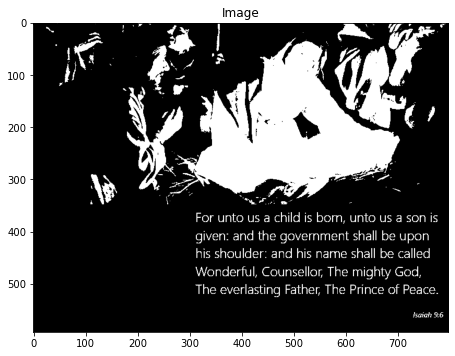

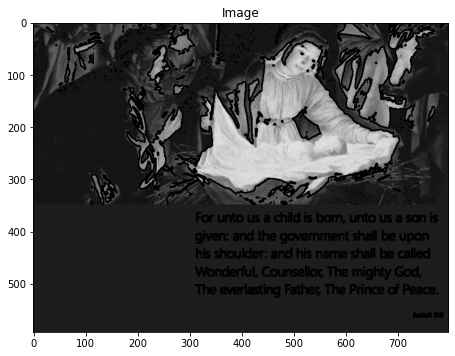

Number of Contours =  573


In [41]:
gray = cv2.imread("presentation.png",0)
imshow(gray,"Original Image")

_,th2 = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
imshow(th2)

con,hie = cv2.findContours(th2,cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

cv2.drawContours(gray,con,-1,(0,255,0),thickness = 2)
imshow(gray)

print("Number of Contours = ",str(len(con)))

In [42]:
hie,hie.shape

(array([[[  1,  -1,  -1,  -1],
         [  2,   0,  -1,  -1],
         [  3,   1,  -1,  -1],
         ...,
         [571, 569,  -1,  -1],
         [572, 570,  -1,  -1],
         [ -1, 571,  -1,  -1]]], dtype=int32),
 (1, 573, 4))

### RETR_EXTERNAL
Returns only extreme outer flags. All child contours are left